   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 30.2 MB/s eta 0:00:00
102967424/102967424 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step
Starting R1 processing...


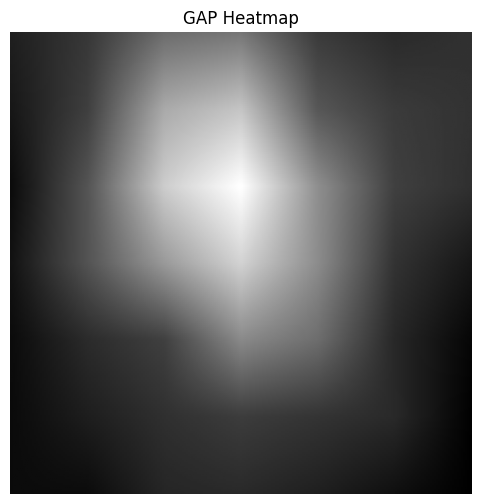

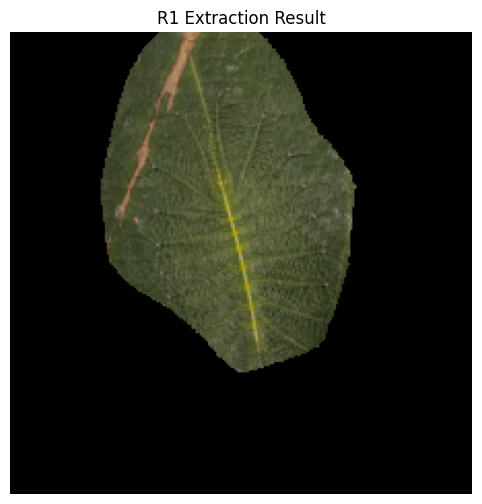

Starting R2 processing...
Original image loaded


<Figure size 300x300 with 0 Axes>

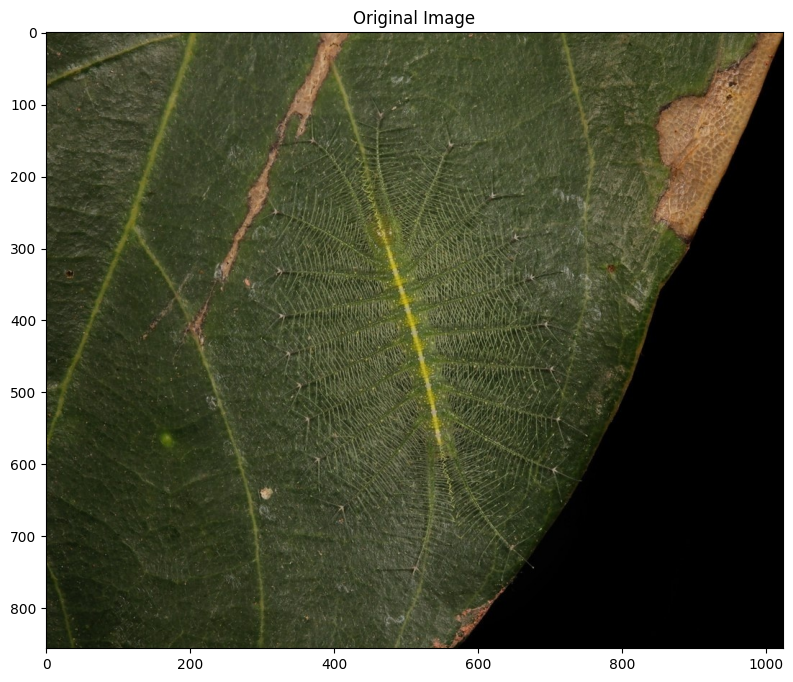

Image resized to 224x224


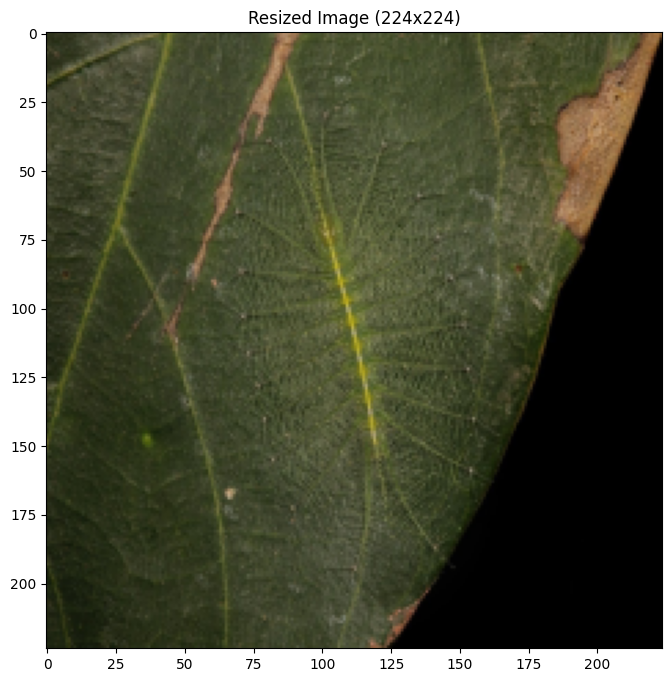

Converted to grayscale


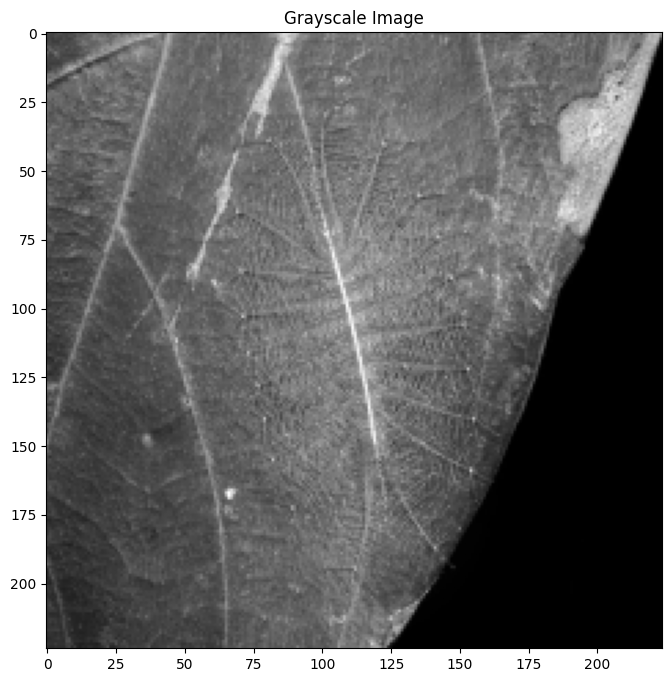

Applied Prewitt edge detection


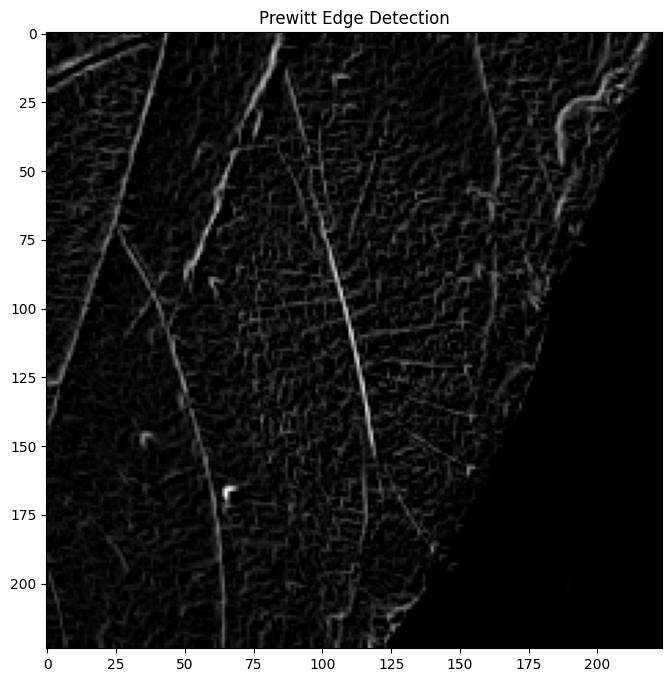

Applied Fourier Transform


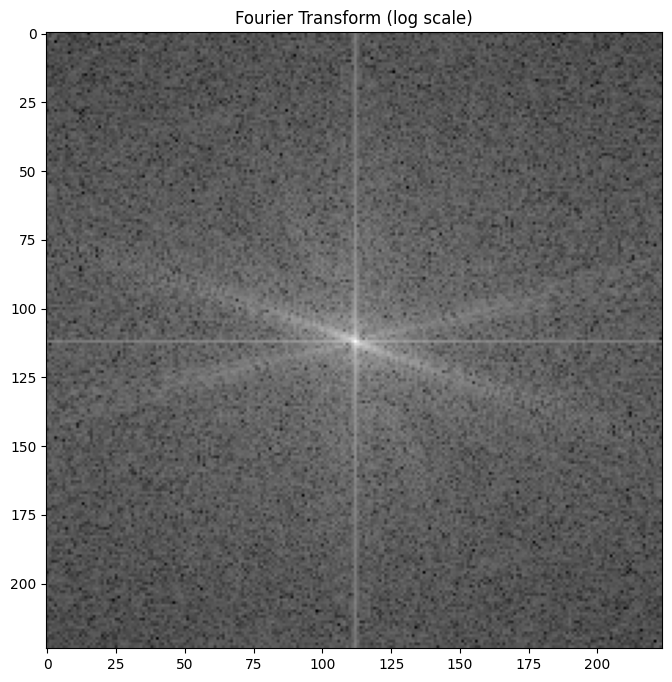

Applied Gaussian High Pass filter


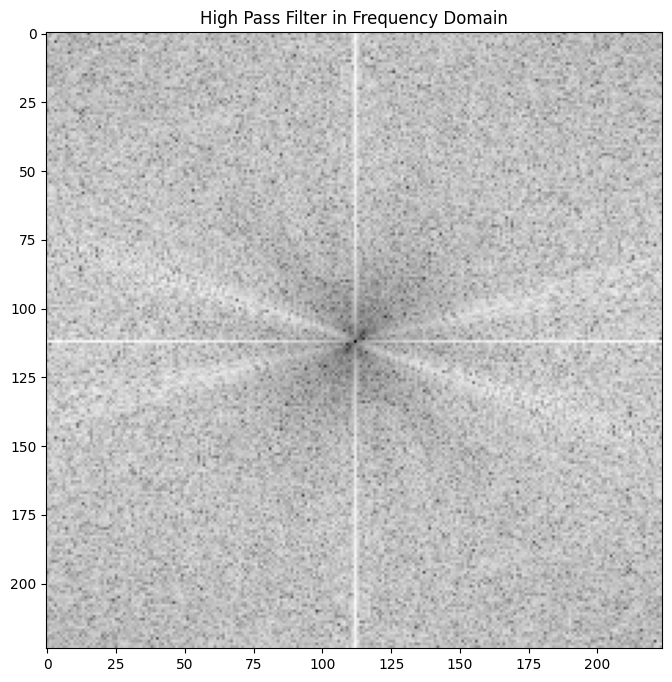

Inverse Fourier Transform for High Pass


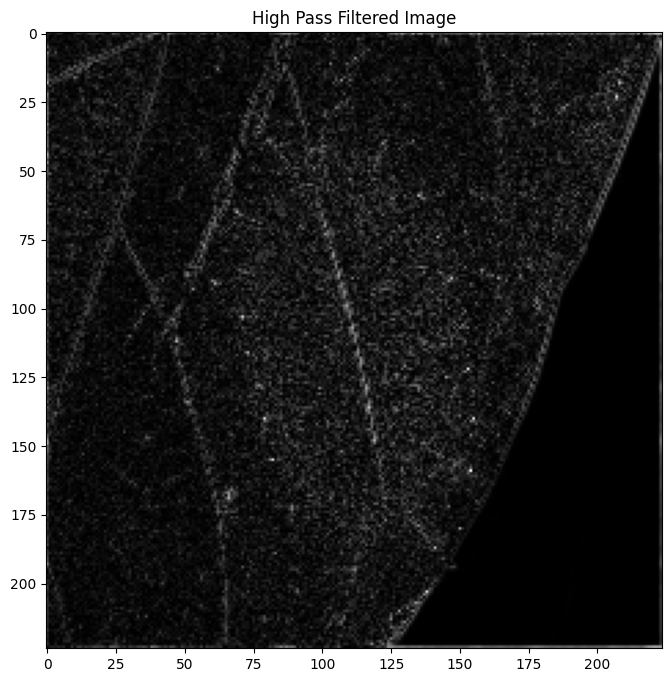

Applied Gaussian Low Pass filter


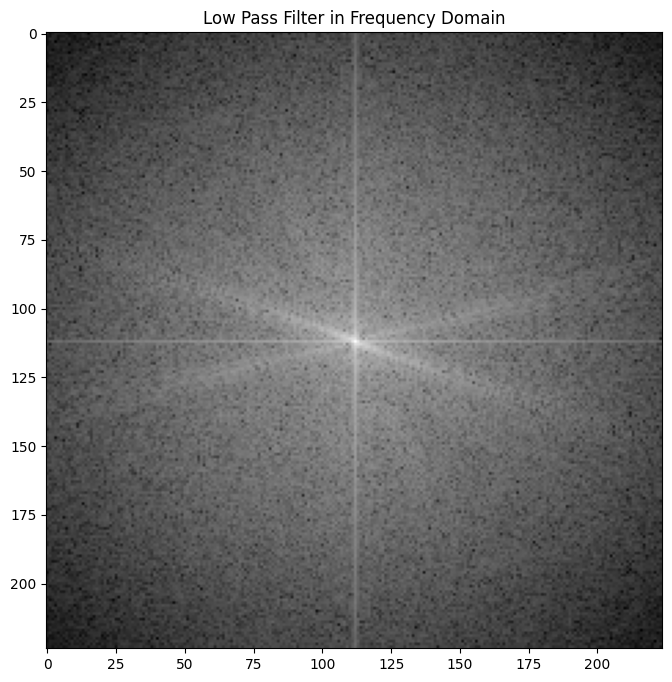

Inverse Fourier Transform for Low Pass


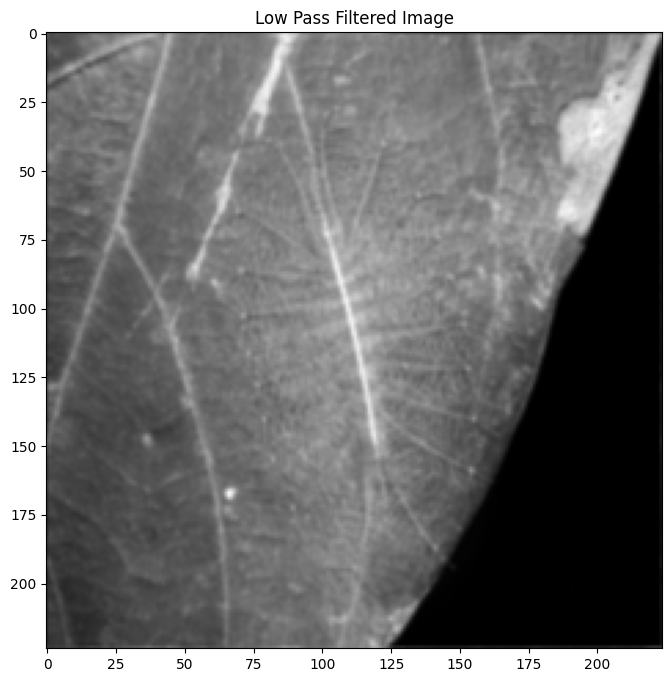

Calculated amplitude from edge detection FFT


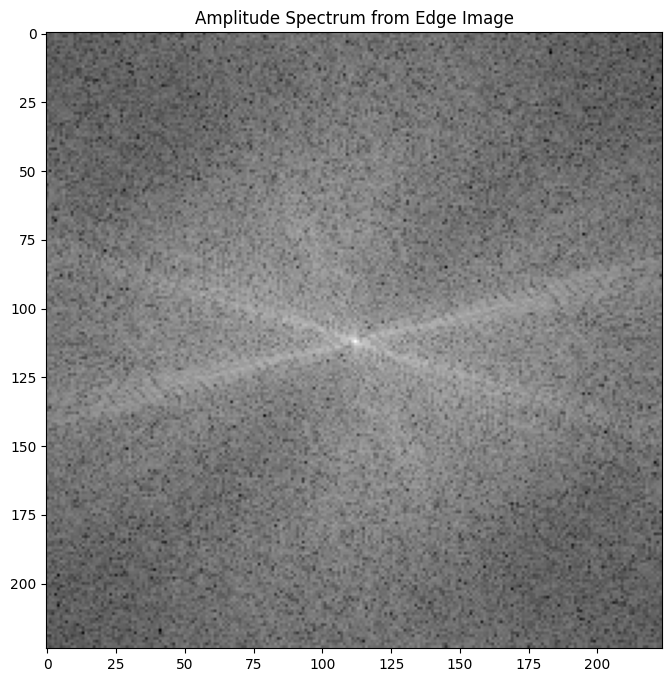

Calculated phase from grayscale FFT


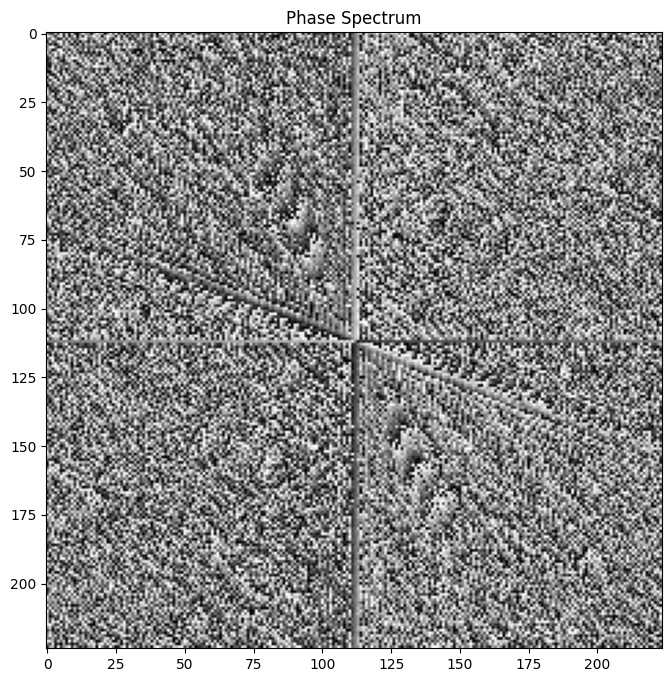

Combined amplitude and phase information


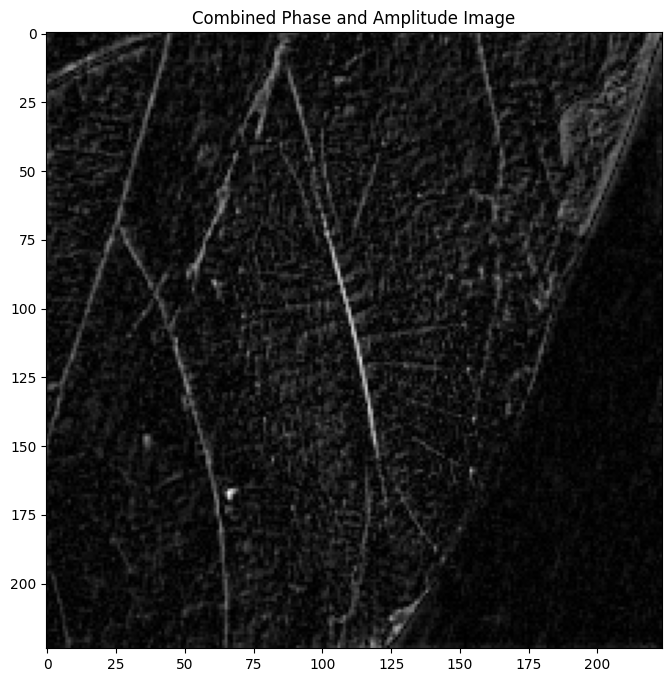

Saved phase output to output/R2/phase_output.jpg
Calculated local entropy with disk(5)


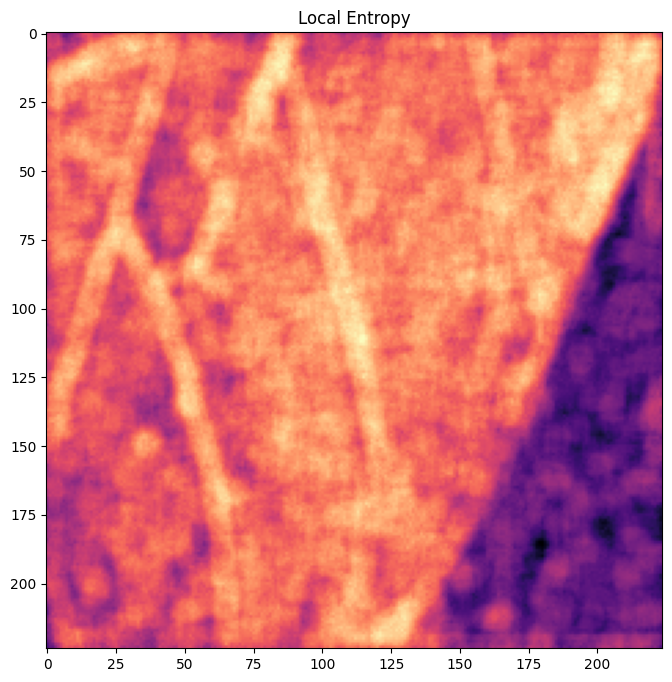

Saved entropy output to output/R2/entropy_output.jpg
Loaded entropy image for histogram analysis
Calculated normalized histogram


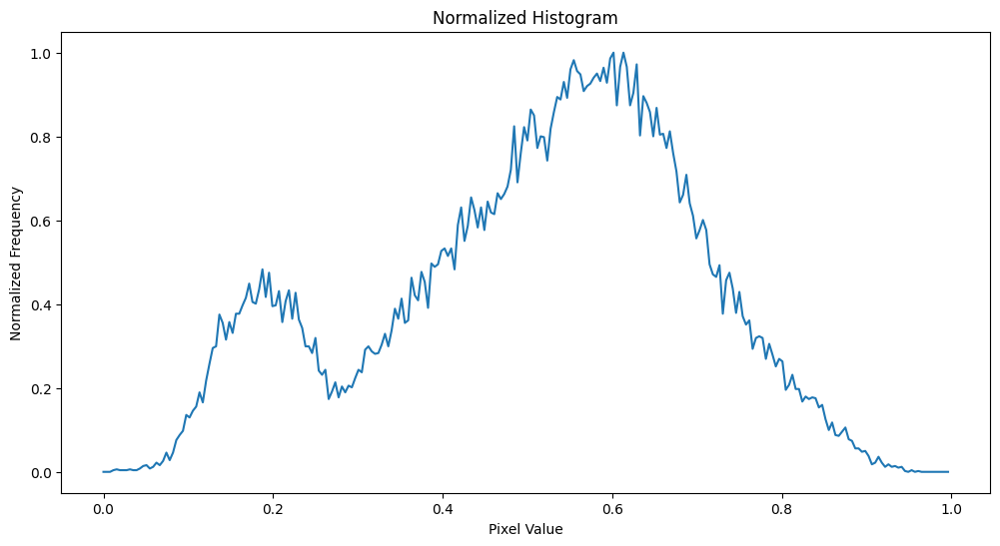

Applied Savitzky-Golay filter to histogram


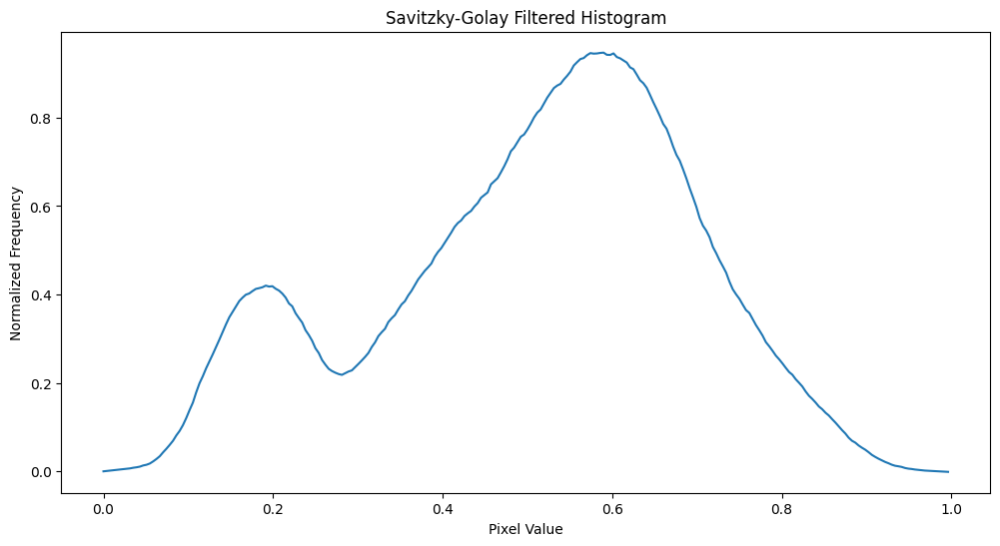

Found 1 peaks in histogram at positions: [151]


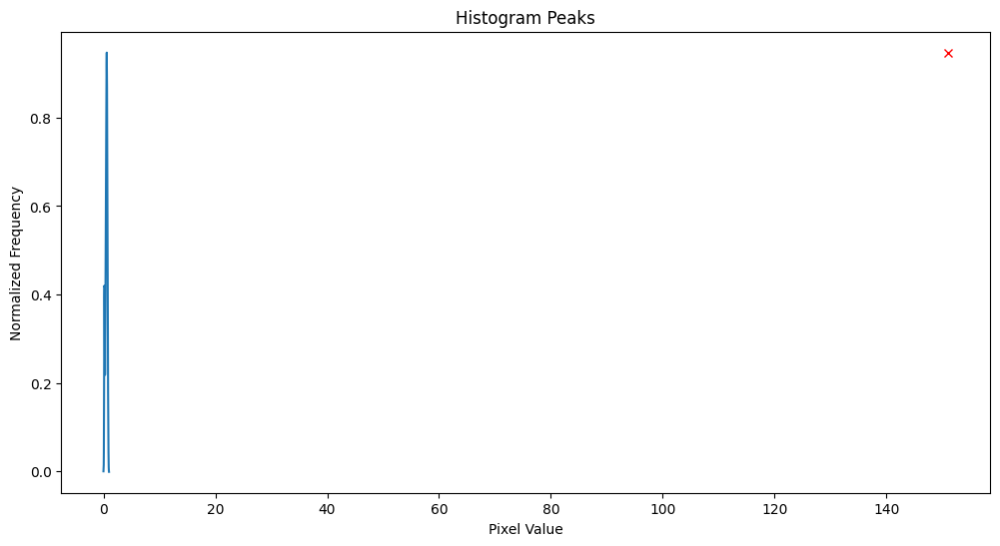

H1Max threshold set to 151
H2Max threshold set to 151
D1: 0, D2: 1.0
Using last peak at position 151 with CutPoint = 0.8525748502994012
ROI range: [135, 255]


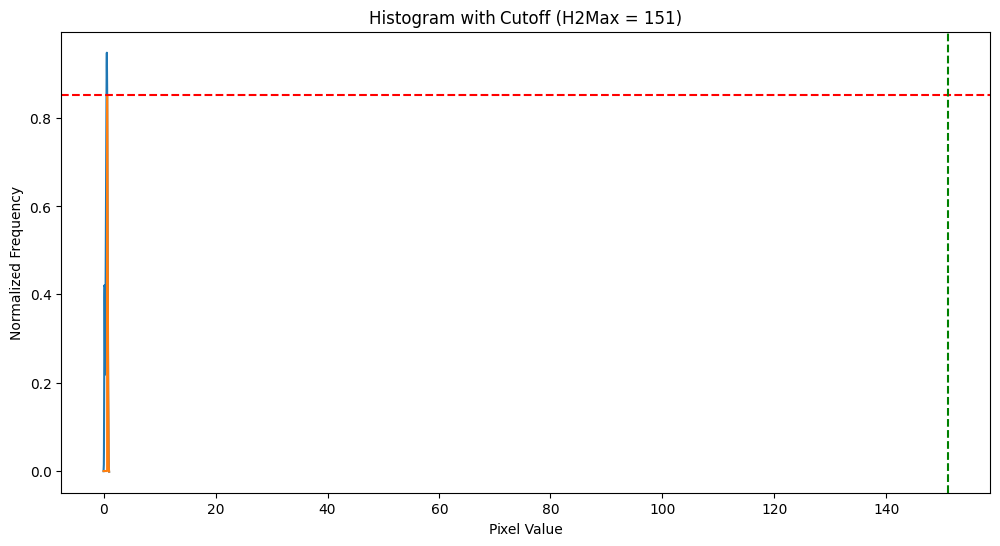

Estimated noise sigma: 0.011322412065765444
Applied non-local means denoising


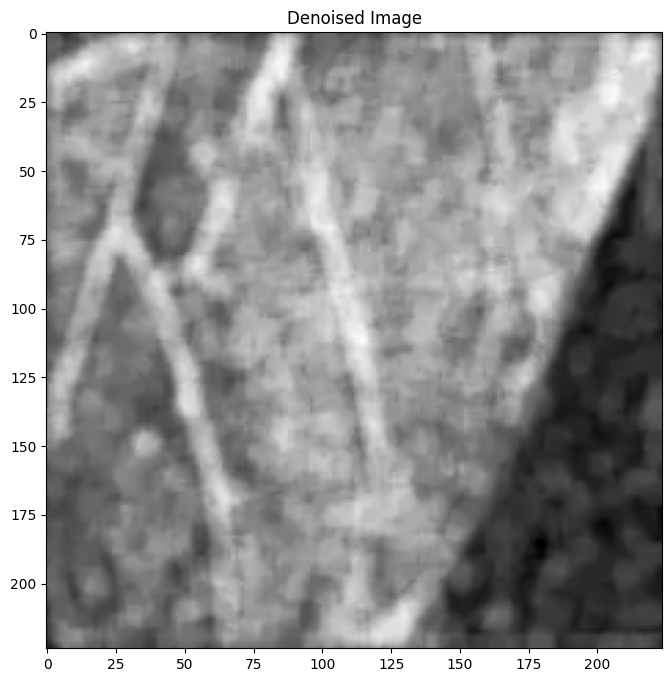

Applied thresholding with H2Max = 151


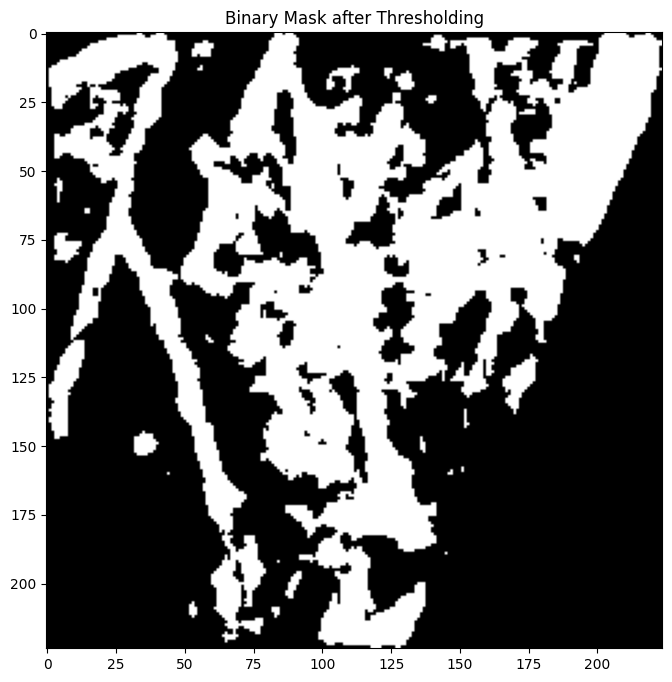

Created initial mask


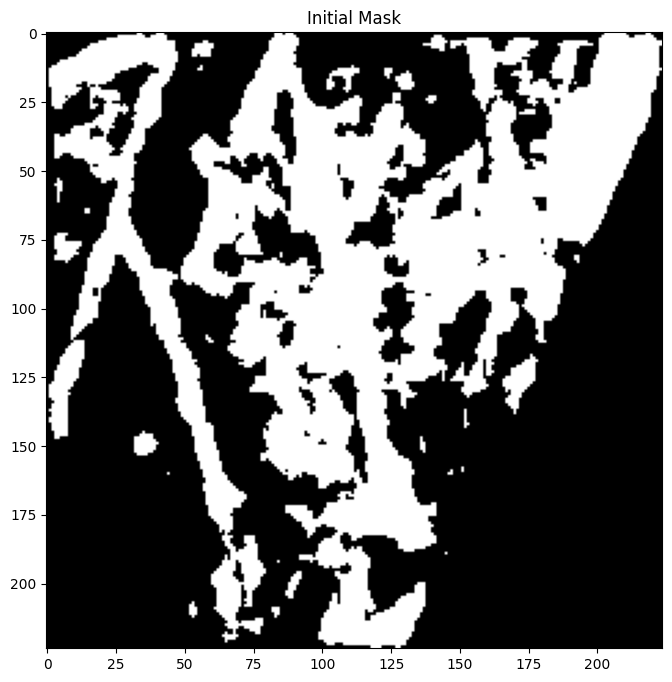

Applied Gaussian smoothing to mask


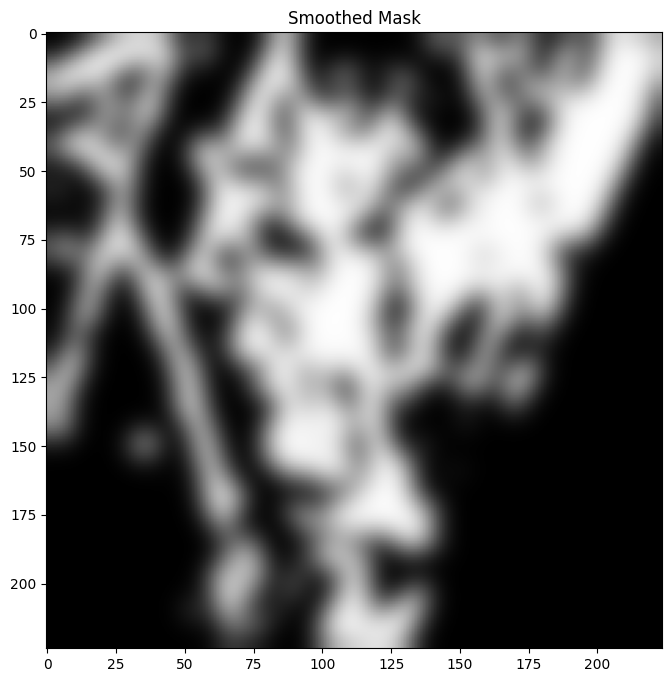

Saved R2 mask to output/R2/R2_Mask.jpg
Loaded R2 mask
Applied Otsu thresholding with value 102


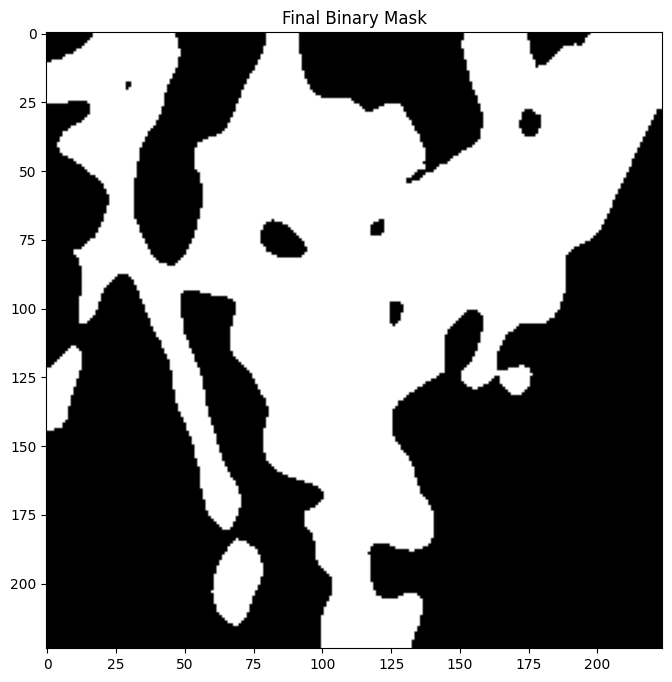

Applied mask to original image


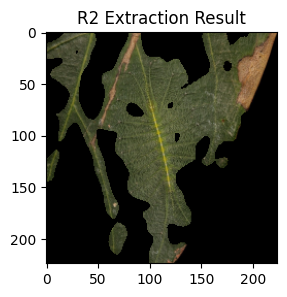

Saved final R2 output to output/R2/R2_final.jpg
Combining results...


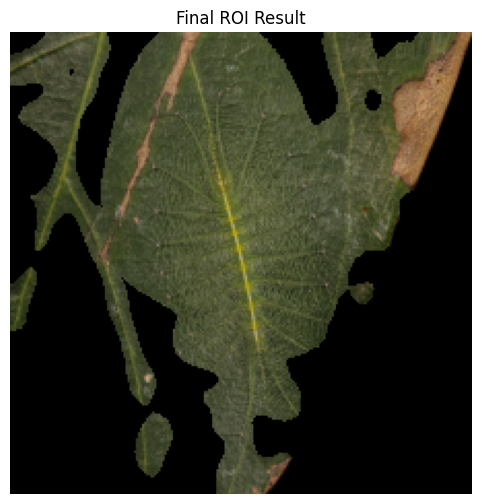

Processing complete. Results saved to output


In [1]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy import ndimage
from scipy.signal import savgol_filter, find_peaks
from skimage.restoration import denoise_nl_means, estimate_sigma
from skimage import img_as_ubyte, img_as_float
from skimage.morphology import disk
from skimage.filters.rank import entropy
from skimage.filters import threshold_otsu
from keras.applications.resnet import ResNet50, preprocess_input
from keras.models import Model
from PIL import Image
from scipy.ndimage import gaussian_filter
import skimage

# Ensure PyWavelets is installed
!pip install PyWavelets


class ImageProcessor:
    def __init__(self, input_path, output_dir="output"):
        """Initialize with input image path and output directory"""
        self.input_image_path = input_path
        self.output_dir = output_dir
        self.img_size = (224, 224)

        # Create output directories
        self.output_folders = {
            "R1": os.path.join(output_dir, "R1"),
            "GAP": os.path.join(output_dir, "GAP(R1)"),
            "Phase": os.path.join(output_dir, "Phase"),
            "Entropy": os.path.join(output_dir, "Entropy"),
            "R2_Mask": os.path.join(output_dir, "R2_Mask"),
            "R2": os.path.join(output_dir, "R2"),
            "Mask": os.path.join(output_dir, "Mask(R1+R2)"),
            "ROI": os.path.join(output_dir, "ROI")
        }

        # Create all output directories
        for folder in self.output_folders.values():
            os.makedirs(folder, exist_ok=True)

        # Initialize ResNet model once
        self.model = ResNet50(weights='imagenet')
        self.last_layer_weights = self.model.layers[-1].get_weights()[0]
        self.ResNet_model = Model(
            inputs=self.model.input,
            outputs=(self.model.layers[-4].output, self.model.layers[-1].output)
        )

        # Load and preprocess the image
        self.original_img = cv2.imread(input_path)
        self.img = cv2.resize(self.original_img, self.img_size, interpolation=cv2.INTER_AREA)
        self.gray_img = cv2.cvtColor(self.img, cv2.COLOR_BGR2GRAY)
        self.output_basename = os.path.basename(input_path)

    def display_image(self, image, title, cmap=None):
        """Helper function to display images"""
        plt.figure(figsize=(8, 6))
        if cmap:
            plt.imshow(image, cmap=cmap)
        else:
            plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        plt.title(title)
        plt.axis('off')
        plt.show()

    def save_image(self, image, folder_key, filename=None):
        """Save image to specified output folder"""
        if filename is None:
            filename = self.output_basename

        output_path = os.path.join(self.output_folders[folder_key], filename)

        # Handle different image types appropriately
        if isinstance(image, np.ndarray) and image.ndim == 2:  # grayscale
            cv2.imwrite(output_path, image)
        elif isinstance(image, np.ndarray) and image.ndim == 3:  # color
            cv2.imwrite(output_path, image)
        else:  # plt figure or other types
            plt.imsave(output_path, image, cmap='gray')

        return output_path

    def process_r1(self):
        """Process image using the R1 method (CAM-based)"""
        # Convert to RGB for ResNet
        img_rgb = Image.fromarray(cv2.cvtColor(self.img, cv2.COLOR_BGR2RGB))
        img_array = np.array(img_rgb)

        # Preprocess for ResNet
        img_tensor = np.expand_dims(img_array, axis=0)
        preprocessed_img = preprocess_input(img_tensor)

        # Get Class Activation Map
        last_conv_output, pred_vec = self.ResNet_model.predict(preprocessed_img, verbose=0)
        last_conv_output = np.squeeze(last_conv_output)  # 7x7x2048
        pred = np.argmax(pred_vec)

        # Upsample to original size
        h_factor = self.img_size[0] / last_conv_output.shape[0]
        w_factor = self.img_size[1] / last_conv_output.shape[1]
        upsampled_conv_output = ndimage.zoom(last_conv_output, (h_factor, w_factor, 1), order=1)

        # Create heatmap using class weights
        class_weights = self.last_layer_weights[:, pred]  # 2048 weights for predicted class
        heat_map = np.dot(
            upsampled_conv_output.reshape((self.img_size[0] * self.img_size[1], 2048)),
            class_weights
        ).reshape(self.img_size)

        # Save and display GAP heatmap
        gap_path = self.save_image(heat_map, "GAP")
        self.display_image(heat_map, "GAP Heatmap", cmap='gray')

        # Apply Otsu's thresholding to create binary mask
        gap_img = cv2.imread(gap_path, cv2.IMREAD_GRAYSCALE)
        _, binary_mask = cv2.threshold(gap_img, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

        # Apply binary mask to original image
        r1_result = self.img.copy()
        r1_result[binary_mask == 0] = 0

        # Save R1 result
        r1_path = self.save_image(r1_result, "R1")
        self.display_image(r1_result, "R1 Extraction Result")
        plt.figure(figsize=(3, 3))

        return r1_path, gap_path, binary_mask

    def process_r2(self, image_path, output_folder="R2_Output"):
        """Process a single image with the R2 algorithm and display intermediate results"""
        # Create output folder if it doesn't exist
        os.makedirs(output_folder, exist_ok=True)

        # Read and resize the image
        dim = (224, 224)
        img_c1 = cv2.imread(image_path)
        print("Original image loaded")
        plt.figure(figsize=(10, 8))
        plt.imshow(cv2.cvtColor(img_c1, cv2.COLOR_BGR2RGB))
        plt.title("Original Image")
        plt.show()

        img_c1 = cv2.resize(img_c1, dim, interpolation=cv2.INTER_AREA)
        print("Image resized to 224x224")
        plt.figure(figsize=(10, 8))
        plt.imshow(cv2.cvtColor(img_c1, cv2.COLOR_BGR2RGB))
        plt.title("Resized Image (224x224)")
        plt.show()

        main = img_c1.copy()
        img_c1_gray = cv2.cvtColor(img_c1, cv2.COLOR_BGR2GRAY)
        print("Converted to grayscale")
        plt.figure(figsize=(10, 8))
        plt.imshow(img_c1_gray, cmap='gray')
        plt.title("Grayscale Image")
        plt.show()

        # Prewitt Edge Detection
        prewitt_x = cv2.filter2D(img_c1_gray, -1, np.array([[-1, 0, 1], [-1, 0, 1], [-1, 0, 1]]))  # Horizontal Edges
        prewitt_y = cv2.filter2D(img_c1_gray, -1, np.array([[-1, -1, -1], [0, 0, 0], [1, 1, 1]]))  # Vertical Edges

        # Compute gradient magnitude
        edge = cv2.magnitude(prewitt_x.astype(np.float32), prewitt_y.astype(np.float32))
        edge = np.uint8(255 * edge / np.max(edge))

        print("Applied Prewitt edge detection")
        plt.figure(figsize=(10, 8))
        plt.imshow(edge, cmap='gray')
        plt.title("Prewitt Edge Detection")
        plt.show()

        # Define Gaussian filter functions
        def gaussianLP(D0, imgShape):
            base = np.zeros(imgShape[:2])
            rows, cols = imgShape[:2]
            center = (rows / 2, cols / 2)
            for x in range(cols):
                for y in range(rows):
                    base[y, x] = np.exp(((-distance((y, x), center) ** 2) / (2 * (D0 ** 2))))
            return base

        def gaussianHP(D0, imgShape):
            base = np.zeros(imgShape[:2])
            rows, cols = imgShape[:2]
            center = (rows / 2, cols / 2)
            for x in range(cols):
                for y in range(rows):
                    base[y, x] = 1 - np.exp(((-distance((y, x), center) ** 2) / (2 * (D0 ** 2))))
            return base

        def distance(point1, point2):
            return np.sqrt((point1[0] - point2[0]) ** 2 + (point1[1] - point2[1]) ** 2)

        # Fourier Transform of the grayscale image
        original = np.fft.fft2(img_c1_gray)
        center = np.fft.fftshift(original)
        print("Applied Fourier Transform")
        plt.figure(figsize=(10, 8))
        plt.imshow(np.log(1 + np.abs(center)), cmap='gray')
        plt.title("Fourier Transform (log scale)")
        plt.show()

        # Highpass filtering
        HighPassCenter = center * gaussianHP(50, img_c1_gray.shape)
        print("Applied Gaussian High Pass filter")
        plt.figure(figsize=(10, 8))
        plt.imshow(np.log(1 + np.abs(HighPassCenter)), cmap='gray')
        plt.title("High Pass Filter in Frequency Domain")
        plt.show()

        HighPass = np.fft.ifftshift(HighPassCenter)
        inverse_HighPass = np.fft.ifft2(HighPass)
        highpass = np.abs(inverse_HighPass)
        print("Inverse Fourier Transform for High Pass")
        plt.figure(figsize=(10, 8))
        plt.imshow(highpass, cmap='gray')
        plt.title("High Pass Filtered Image")
        plt.show()

        # Lowpass filtering
        LowPassCenter = center * gaussianLP(50, img_c1_gray.shape)
        print("Applied Gaussian Low Pass filter")
        plt.figure(figsize=(10, 8))
        plt.imshow(np.log(1 + np.abs(LowPassCenter)), cmap='gray')
        plt.title("Low Pass Filter in Frequency Domain")
        plt.show()

        LowPass = np.fft.ifftshift(LowPassCenter)
        inverse_LowPass = np.fft.ifft2(LowPass)
        lowpass = np.abs(inverse_LowPass)
        print("Inverse Fourier Transform for Low Pass")
        plt.figure(figsize=(10, 8))
        plt.imshow(lowpass, cmap='gray')
        plt.title("Low Pass Filtered Image")
        plt.show()

        # Amplitude calculation from edge detection
        fft = np.fft.fftshift(np.fft.fft2(edge))  # Using edge image
        amplitude = np.sqrt(np.real(fft) ** 2 + np.imag(fft) ** 2)
        print("Calculated amplitude from edge detection FFT")
        plt.figure(figsize=(10, 8))
        plt.imshow(np.log(1 + amplitude), cmap='gray')
        plt.title("Amplitude Spectrum from Edge Image")
        plt.show()

        # Phase calculation from grayscale image
        fft1 = np.fft.fftshift(np.fft.fft2(img_c1_gray))
        phase = np.arctan2(np.imag(fft1), np.real(fft1))
        print("Calculated phase from grayscale FFT")
        plt.figure(figsize=(10, 8))
        plt.imshow(phase, cmap='gray')
        plt.title("Phase Spectrum")
        plt.show()

        # Combining Phase and Amplitude
        comb = np.multiply(amplitude, np.exp(1j * phase))
        comb = np.real(np.fft.ifft2(comb))
        comb = np.abs(comb)
        print("Combined amplitude and phase information")
        plt.figure(figsize=(10, 8))
        plt.imshow(comb, cmap='gray')
        plt.title("Combined Phase and Amplitude Image")
        plt.show()

        # Save phase output
        phase_output_path = os.path.join(output_folder, "phase_output.jpg")
        plt.imsave(phase_output_path, comb, cmap='gray')
        print(f"Saved phase output to {phase_output_path}")

        # Local Entropy
        img = cv2.imread(phase_output_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        img1 = entropy(img, disk(5))
        print("Calculated local entropy with disk(5)")
        plt.figure(figsize=(10, 8))
        plt.imshow(img1, cmap='magma')
        plt.title("Local Entropy")
        plt.show()

        # Save entropy output
        entropy_output_path = os.path.join(output_folder, "entropy_output.jpg")
        plt.imsave(entropy_output_path, img1, cmap='magma')
        print(f"Saved entropy output to {entropy_output_path}")

        # Histogram analysis
        image = skimage.io.imread(fname=entropy_output_path, as_gray=True)
        print("Loaded entropy image for histogram analysis")

        histogram, bin_edges = np.histogram(image, bins=256, range=(0, 1))
        histgram1 = histogram / (histogram.max())
        print("Calculated normalized histogram")
        plt.figure(figsize=(12, 6))
        plt.plot(bin_edges[0:-1], histgram1)
        plt.title("Normalized Histogram")
        plt.xlabel("Pixel Value")
        plt.ylabel("Normalized Frequency")
        plt.show()

        # Savitzky Golay filtering
        window_length = min(15, len(histgram1) - 1) if len(histgram1) > 15 else len(histgram1) - 1
        if window_length % 2 == 0:
            window_length -= 1  # Ensure window_length is odd
        arr = savgol_filter(histgram1, window_length, 1, mode='interp')

        print("Applied Savitzky-Golay filter to histogram")
        plt.figure(figsize=(12, 6))
        plt.plot(bin_edges[:len(arr)], arr)
        plt.title("Savitzky-Golay Filtered Histogram")
        plt.xlabel("Pixel Value")
        plt.ylabel("Normalized Frequency")
        plt.show()

        # Find peaks in histogram
        peaks, _ = find_peaks(arr, height=0.5, distance=50)
        print(f"Found {len(peaks)} peaks in histogram at positions: {peaks}")

        # Mark peaks on the plot
        plt.figure(figsize=(12, 6))
        plt.plot(bin_edges[:len(arr)], arr)
        plt.plot(peaks, arr[peaks], "x", color='red')
        plt.title("Histogram Peaks")
        plt.xlabel("Pixel Value")
        plt.ylabel("Normalized Frequency")
        plt.show()

        # Calculate HMAX2
        if len(peaks) > 1 and arr[peaks[-2]] >= 0.4 * arr[peaks[-1]]:  # β = 0.4 condition
            H1Max = peaks[-2]  # First significant peak
            H2Max = peaks[-1]  # Last peak
        elif len(peaks) > 1:
            H1Max = peaks[0]  # First peak
            H2Max = peaks[-1]  # Last peak
        elif len(peaks) == 1:
            H1Max = H2Max = peaks[0]  # If only one peak exists, use it for both
        else:
            print("No valid peaks found in histogram, using fallback.")
            H1Max = H2Max = np.argmax(arr)  # Use highest value as fallback

        print(f"H1Max threshold set to {H1Max}")
        print(f"H2Max threshold set to {H2Max}")

        # Compute D1 and D2 Metrics
        D1 = abs(H1Max - H2Max)
        D2 = H2Max / H1Max if H1Max != 0 else 0  # Avoid division by zero
        print(f"D1: {D1}, D2: {D2}")

        # Set CutPoint using γ = 0.9
        CutPoint = 0.9 * arr[H2Max]
        print(f"Using last peak at position {H2Max} with CutPoint = {CutPoint}")

        # Compute α for ROI Selection (First pixel above CutPoint)
        alpha = np.where(arr >= CutPoint)[0][0]  # First occurrence above CutPoint
        print(f"ROI range: [{alpha}, 255]")

        arr1 = []
        for j in range(1, 255):
            if j >= H2Max:
                if arr[j] <= CutPoint:
                    arr1.append(arr[j])
                else:
                    arr1.append(0)
            else:
                arr1.append(0)

        # Plot the cutoff on histogram
        plt.figure(figsize=(12, 6))
        plt.plot(bin_edges[:len(arr)], arr)
        plt.plot(bin_edges[:len(arr1)], arr1)
        plt.axhline(y=CutPoint, color='r', linestyle='--')
        plt.axvline(x=H2Max, color='g', linestyle='--')
        plt.title(f"Histogram with Cutoff (H2Max = {H2Max})")
        plt.xlabel("Pixel Value")
        plt.ylabel("Normalized Frequency")
        plt.show()

        # Generating mask image after histogram analysis
        float_img = img_as_float(image)
        sigma_est = np.mean(estimate_sigma(image, channel_axis=-1))
        print(f"Estimated noise sigma: {sigma_est}")

        denoise_img = denoise_nl_means(float_img, h=1.15 * sigma_est, fast_mode=True,
                                        patch_size=5, patch_distance=3, channel_axis=None)

        print("Applied non-local means denoising")
        plt.figure(figsize=(10, 8))
        plt.imshow(denoise_img, cmap='gray')
        plt.title("Denoised Image")
        plt.show()

        denoise_img_as_8byte = img_as_ubyte(denoise_img)
        segm1 = (denoise_img_as_8byte >= H2Max) & (denoise_img_as_8byte <= 255)
        print(f"Applied thresholding with H2Max = {H2Max}")
        plt.figure(figsize=(10, 8))
        plt.imshow(segm1, cmap='gray')
        plt.title("Binary Mask after Thresholding")
        plt.show()

        all_segments = np.zeros((denoise_img_as_8byte.shape[0], denoise_img_as_8byte.shape[1], 3))
        all_segments[segm1] = (1, 1, 1)
        print("Created initial mask")
        plt.figure(figsize=(10, 8))
        plt.imshow(all_segments)
        plt.title("Initial Mask")
        plt.show()

        all_segments = gaussian_filter(all_segments, sigma=5)
        print("Applied Gaussian smoothing to mask")
        plt.figure(figsize=(10, 8))
        plt.imshow(all_segments)
        plt.title("Smoothed Mask")
        plt.show()

        # Save R2 mask
        R2_Mask_path = os.path.join(output_folder, "R2_Mask.jpg")
        plt.imsave(R2_Mask_path, all_segments, cmap='gray')
        print(f"Saved R2 mask to {R2_Mask_path}")

        # Apply mask to original image
        img = cv2.imread(R2_Mask_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        print("Loaded R2 mask")

        t = skimage.filters.threshold_otsu(img)
        binary_mask = img > t
        print(f"Applied Otsu thresholding with value {t}")
        plt.figure(figsize=(10, 8))
        plt.imshow(binary_mask, cmap='gray')
        plt.title("Final Binary Mask")
        plt.show()

        selection = main.copy()
        selection[~binary_mask] = 0
        print("Applied mask to original image")
        plt.figure(figsize=(3, 3))
        plt.imshow(cv2.cvtColor(selection, cv2.COLOR_BGR2RGB))
        plt.title("R2 Extraction Result")
        plt.show()

        # Save final R2 output
        R2_output_path = os.path.join(output_folder, "R2_final.jpg")
        cv2.imwrite(R2_output_path, selection)
        print(f"Saved final R2 output to {R2_output_path}")

        return binary_mask  # Return the binary mask instead of the path

    def combine_results(self, r1_mask, r2_mask):
        """Combine R1 and R2 results"""
        # Convert masks to binary format if needed
        if r1_mask.dtype != bool:
            _, r1_binary = cv2.threshold(r1_mask, 170, 255, cv2.THRESH_BINARY)
        else:
            r1_binary = r1_mask.astype(np.uint8) * 255

        if r2_mask.dtype != bool:
            _, r2_binary = cv2.threshold(r2_mask, 1, 255, cv2.THRESH_BINARY)
        else:
            r2_binary = r2_mask.astype(np.uint8) * 255

        # Combine masks
        combined_mask = cv2.addWeighted(r1_binary, 1, r2_binary, 1, 0)
        self.save_image(combined_mask, "Mask")

        # Apply Otsu thresholding
        thresh = threshold_otsu(combined_mask)
        final_binary_mask = combined_mask > thresh

        # Apply mask to original image
        final_result = self.img.copy()
        final_result[~final_binary_mask] = 0

        # Save final result
        final_path = self.save_image(final_result, "ROI")
        self.display_image(final_result, "Final ROI Result")

        return final_path

    def process(self):
        """Run the complete image processing pipeline"""
        print("Starting R1 processing...")
        r1_path, gap_path, r1_mask = self.process_r1()

        print("Starting R2 processing...")
        r2_mask = self.process_r2(self.input_image_path, output_folder=self.output_folders["R2"])

        print("Combining results...")
        final_path = self.combine_results(r1_mask, r2_mask)

        print(f"Processing complete. Results saved to {self.output_dir}")
        return final_path


# Example usage
if __name__ == "__main__":
    # Replace with your image path
    image_path = "/content/AAA_dataset/COD10K-CAM-2-Terrestrial-24-Caterpillar-1626.jpg"

    # Create processor and run pipeline
    processor = ImageProcessor(image_path, output_dir="output")
    final_result = processor.process()

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


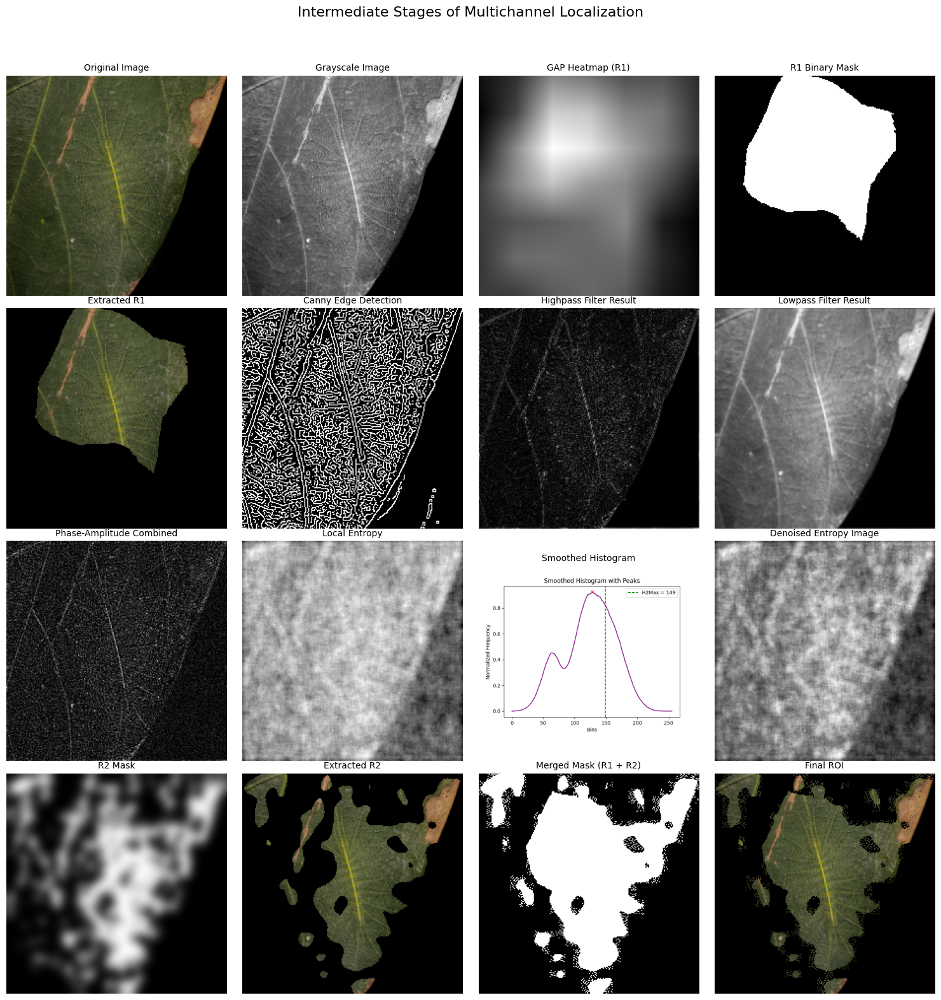

Final ROI saved to: ROI/COD10K-CAM-2-Terrestrial-24-Caterpillar-1626.jpg


In [2]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter, zoom
from scipy.signal import find_peaks, savgol_filter
from skimage.morphology import disk
from skimage.filters.rank import entropy
from skimage.restoration import denoise_nl_means, estimate_sigma
from skimage import img_as_ubyte, img_as_float
import skimage
from keras.applications.resnet import ResNet50, preprocess_input
from keras.models import Model
from PIL import Image

# Input and output paths
input_image_path = "/content/AAA_dataset/COD10K-CAM-2-Terrestrial-24-Caterpillar-1626.jpg"  # Change this to your image file
output_folders = {
    "GAP(R1)": "/content/AAA_dataset/output2/GAP(R1)",
    "R1": "/content/AAA_dataset/output2/R1",
    "Phase": "Phase",
    "Entropy": "Entropy",
    "R2_Mask": "R2_Mask",
    "R2": "R2",
    "Mask(R1+R2)": "Mask(R1+R2)",
    "ROI": "ROI"
}

# Ensure output directories exist
for folder in output_folders.values():
    os.makedirs(folder, exist_ok=True)

# Load ResNet50 model once for R1
model = ResNet50(weights='imagenet')
last_layer_weights = model.layers[-1].get_weights()[0]  # Predictions layer
ResNet_model = Model(inputs=model.input, outputs=(model.layers[-4].output, model.layers[-1].output))

# Dictionary to store intermediate images
intermediate_images = {}

# Load and preprocess image
img_c1 = cv2.imread(input_image_path)
if img_c1 is None:
    raise ValueError("Error loading image. Check the file path!")

dim = (224, 224)
img_c1 = cv2.resize(img_c1, dim, interpolation=cv2.INTER_AREA)
main = img_c1.copy()  # Keep original for later use
img_c1_gray = cv2.cvtColor(img_c1, cv2.COLOR_BGR2GRAY)

intermediate_images["Original Image"] = cv2.cvtColor(img_c1, cv2.COLOR_BGR2RGB)
intermediate_images["Grayscale Image"] = img_c1_gray

### Channel 1 (R1): CAM + GAP ###
img = Image.fromarray(img_c1, 'RGB')
img = np.array(img)
img_tensor = np.expand_dims(img, axis=0)
preprocessed_img = preprocess_input(img_tensor)

# Get CAM
last_conv_output, pred_vec = ResNet_model.predict(preprocessed_img)
last_conv_output = np.squeeze(last_conv_output)  # 7x7x2048
pred = np.argmax(pred_vec)
h = int(img.shape[0] / last_conv_output.shape[0])
w = int(img.shape[1] / last_conv_output.shape[1])
upsampled_last_conv_output = zoom(last_conv_output, (h, w, 1), order=1)
last_layer_weights_for_pred = last_layer_weights[:, pred]  # dim: (2048,)
heat_map = np.dot(upsampled_last_conv_output.reshape((224 * 224, 2048)), last_layer_weights_for_pred).reshape(224, 224)

# Save GAP heatmap
output_image_name = os.path.basename(input_image_path)
GAP_output_path = os.path.join(output_folders["GAP(R1)"], output_image_name)
plt.imsave(GAP_output_path, heat_map, cmap='gray')
intermediate_images["GAP Heatmap (R1)"] = heat_map

# Post-processing on GAP image
image1 = cv2.imread(GAP_output_path, cv2.IMREAD_GRAYSCALE)
T, binary_mask = cv2.threshold(image1, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
intermediate_images["R1 Binary Mask"] = binary_mask

# Apply binary mask for R1
selection_r1 = main.copy()
selection_r1[binary_mask == 0] = 0
R1_output_path = os.path.join(output_folders["R1"], output_image_name)
cv2.imwrite(R1_output_path, selection_r1)
intermediate_images["Extracted R1"] = cv2.cvtColor(selection_r1, cv2.COLOR_BGR2RGB)

### Channel 2 (R2): Fourier Spectra and Local Entropy ###

# Step 1: Canny Edge Detection
t_lower = 1  # Lower threshold
t_upper = 50  # Upper threshold
aperture_size = 7  # Aperture size
L2Gradient = True  # Boolean↑
edge = cv2.Canny(img_c1_gray, t_lower, t_upper, apertureSize=aperture_size, L2gradient=L2Gradient)
intermediate_images["Canny Edge Detection"] = edge

# Gaussian Filter Functions
def gaussianLP(D0, imgShape):
    base = np.zeros(imgShape[:2])
    rows, cols = imgShape[:2]
    center = (rows / 2, cols / 2)
    for x in range(cols):
        for y in range(rows):
            base[y, x] = np.exp(((-distance((y, x), center) ** 2) / (2 * (D0 ** 2))))
    return base

def gaussianHP(D0, imgShape):
    base = np.zeros(imgShape[:2])
    rows, cols = imgShape[:2]
    center = (rows / 2, cols / 2)
    for x in range(cols):
        for y in range(rows):
            base[y, x] = 1 - np.exp(((-distance((y, x), center) ** 2) / (2 * (D0 ** 2))))
    return base

def distance(point1, point2):
    return np.sqrt((point1[0] - point2[0]) ** 2 + (point1[1] - point2[1]) ** 2)

# Step 2: Fourier Transform and Filtering
original = np.fft.fft2(img_c1_gray)
center = np.fft.fftshift(original)
HighPassCenter = center * gaussianHP(50, img_c1_gray.shape)
HighPass = np.fft.ifftshift(HighPassCenter)
inverse_HighPass = np.fft.ifft2(HighPass)
highpass = np.abs(inverse_HighPass)
LowPassCenter = center * gaussianLP(50, img_c1_gray.shape)
LowPass = np.fft.ifftshift(LowPassCenter)
inverse_LowPass = np.fft.ifft2(LowPass)
lowpass = np.abs(inverse_LowPass)

intermediate_images["Highpass Filter Result"] = highpass
intermediate_images["Lowpass Filter Result"] = lowpass

# Step 3: Amplitude and Phase
fft = np.fft.fftshift(np.fft.fft2(edge))  # Using Canny edges for amplitude
amplitude = np.sqrt(np.real(fft) ** 2 + np.imag(fft) ** 2)
fft1 = np.fft.fftshift(np.fft.fft2(img_c1_gray))
phase = np.arctan2(np.imag(fft1), np.real(fft1))
comb = np.multiply(amplitude, np.exp(1j * phase))
comb = np.real(np.fft.ifft2(comb))
comb = np.abs(comb)

# Save and Store: Combined Phase-Amplitude Image
phase_output_path = os.path.join(output_folders["Phase"], output_image_name)
plt.imsave(phase_output_path, comb, cmap='gray')
intermediate_images["Phase-Amplitude Combined"] = comb

# Step 4: Local Entropy Computation
img = cv2.imread(phase_output_path, cv2.IMREAD_GRAYSCALE)
img1 = entropy(img, disk(5))
entropy_output_path = os.path.join(output_folders["Entropy"], output_image_name)
plt.imsave(entropy_output_path, img1, cmap='magma')
intermediate_images["Local Entropy"] = img1

# Step 5: Histogram Analysis
image = skimage.io.imread(entropy_output_path, as_gray=True)
histogram, bin_edges = np.histogram(image, bins=256, range=(0, 1))
histogram_normalized = histogram / (histogram.max() + 1e-10)
arr = savgol_filter(histogram_normalized, 15, 1, mode='interp')
peaks, _ = find_peaks(arr, height=0.5, distance=50)

if len(peaks) > 0:
    index = peaks[-1]
    CutPoint = (arr[index] * 90) / 100
    H2Max = None
    for j in range(index, 255):
        if arr[j] <= CutPoint:
            H2Max = j + 1
            break
    if H2Max is None:
        H2Max = index
else:
    H2Max = 0

# Store histogram (as a plot image)
fig, ax = plt.subplots()
ax.plot(arr, color='purple')
ax.plot(peaks, arr[peaks], "x", color='red')
ax.axvline(x=H2Max, color='green', linestyle='--', label=f'H2Max = {H2Max}')
ax.set_title("Smoothed Histogram with Peaks")
ax.set_xlabel('Bins')
ax.set_ylabel('Normalized Frequency')
ax.legend()
fig.canvas.draw()
histogram_img = np.array(fig.canvas.renderer.buffer_rgba())
plt.close(fig)
intermediate_images["Smoothed Histogram"] = histogram_img

# Step 6: Denoising and Mask Generation
float_img = img_as_float(image)
sigma_est = np.mean(estimate_sigma(image, channel_axis=None))
denoise_img = denoise_nl_means(float_img, h=1.15 * sigma_est, fast_mode=True, patch_size=5, patch_distance=3)
denoise_img_as_8byte = img_as_ubyte(denoise_img)
intermediate_images["Denoised Entropy Image"] = denoise_img

segm1 = (denoise_img_as_8byte >= H2Max) & (denoise_img_as_8byte <= 255)
all_segments = np.zeros((denoise_img_as_8byte.shape[0], denoise_img_as_8byte.shape[1], 3))
all_segments[segm1] = (1, 1, 1)
all_segments = gaussian_filter(all_segments, sigma=5)

# Save and Store: R2 Mask
R2_Mask_path = os.path.join(output_folders["R2_Mask"], output_image_name)
plt.imsave(R2_Mask_path, all_segments, cmap='gray')
intermediate_images["R2 Mask"] = all_segments

# Step 7: Apply Mask to Extract R2
img = cv2.imread(R2_Mask_path, cv2.IMREAD_GRAYSCALE)
t = skimage.filters.threshold_otsu(img)
binary_mask_r2 = img > t
selection_r2 = main.copy()
selection_r2[~binary_mask_r2] = 0
R2_output_path = os.path.join(output_folders["R2"], output_image_name)
cv2.imwrite(R2_output_path, selection_r2)
intermediate_images["Extracted R2"] = cv2.cvtColor(selection_r2, cv2.COLOR_BGR2RGB)

### Merging R1 and R2 ###
src1 = cv2.imread(GAP_output_path, cv2.IMREAD_GRAYSCALE)
src2 = cv2.imread(R2_output_path, cv2.IMREAD_GRAYSCALE)
ret, thresh1 = cv2.threshold(src1, 170, 255, cv2.THRESH_BINARY)  # R1 threshold
ret, thresh2 = cv2.threshold(src2, 1, 255, cv2.THRESH_BINARY)    # R2 threshold

# Weighted addition
alpha, beta, gamma = 1, 1, 0
dst = cv2.addWeighted(thresh1, alpha, thresh2, beta, gamma)
Final_output_Mask_path = os.path.join(output_folders["Mask(R1+R2)"], output_image_name)
cv2.imwrite(Final_output_Mask_path, dst)
intermediate_images["Merged Mask (R1 + R2)"] = dst

# Generate Final Localized Image
t = skimage.filters.threshold_otsu(dst)
binary_mask_final = dst > t
selection_final = main.copy()
selection_final[~binary_mask_final] = 0
Final_output_path = os.path.join(output_folders["ROI"], output_image_name)
cv2.imwrite(Final_output_path, selection_final)
intermediate_images["Final ROI"] = cv2.cvtColor(selection_final, cv2.COLOR_BGR2RGB)

### Display All Intermediate Images in One Figure ###
num_images = len(intermediate_images)
cols = 4  # Adjust based on preference
rows = (num_images + cols - 1) // cols

fig, axes = plt.subplots(rows, cols, figsize=(15, 4 * rows))
fig.suptitle("Intermediate Stages of Multichannel Localization", fontsize=16)

for ax in axes.flatten():
    ax.axis('off')  # Hide unused axes

for i, (title, img) in enumerate(intermediate_images.items()):
    ax = axes[i // cols, i % cols]
    if title == "Smoothed Histogram":
        ax.imshow(img)  # Histogram is RGBA
    elif len(img.shape) == 3 and img.shape[2] == 3:
        ax.imshow(img)  # RGB images
    else:
        ax.imshow(img, cmap='gray')  # Grayscale images
    ax.set_title(title, fontsize=10)

plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust layout to fit suptitle
plt.show()

print(f"Final ROI saved to: {Final_output_path}")

In [3]:
from scipy.signal import savgol_filter
from skimage.morphology import disk
from skimage.filters.rank import entropy
import os
from scipy.ndimage import gaussian_filter
from scipy.signal import find_peaks
import numpy as np
import scipy  # to upscale the image
import matplotlib.pyplot as plt
import cv2
import skimage
from keras.applications.resnet import ResNet50, preprocess_input
from keras.models import Model
from PIL import Image
import time
from skimage.restoration import denoise_nl_means, estimate_sigma
from skimage import img_as_ubyte, img_as_float

H2Max = 0
i = 1
# start = time.time()

input_folder = "/content/AAA_dataset"
output_folders = ["GAP(R1)", "R1", "Phase", "Entropy", "R2_Mask", "R2", "Mask(R1+R2)", "ROI"]

def ROI(input_folder):
    # Create output folders
    for folder in output_folders:
        os.makedirs(folder, exist_ok=True)

    # Initialize ResNet50 model once
    model = ResNet50(weights='imagenet')
    last_layer_weights = model.layers[-1].get_weights()[0]  # Predictions layer
    ResNet_model = Model(inputs=model.input,
                         outputs=(model.layers[-4].output, model.layers[-1].output))

    # Get the list of image files in the input folder
    image_files = [f for f in os.listdir(input_folder) if os.path.isfile(os.path.join(input_folder, f))]

    # Iterate over each image in file
    for image_file in image_files:
        # Open the image file
        image_path = os.path.join(input_folder, image_file)
        dim = (224, 224)
        img_c1 = cv2.imread(image_path)
        if img_c1 is None:
            print(f"Failed to load image: {image_path}")
            continue
        img_c1 = cv2.resize(img_c1, dim, interpolation=cv2.INTER_AREA)
        main = img_c1
        img_c1_gray = cv2.cvtColor(img_c1, cv2.COLOR_BGR2GRAY)

        ##### R1 #####
        img = Image.fromarray(img_c1, 'RGB')
        img = np.array(img)
        img_tensor = np.expand_dims(img, axis=0)
        preprocessed_img = preprocess_input(img_tensor)

        last_conv_output, pred_vec = ResNet_model.predict(preprocessed_img)
        last_conv_output = np.squeeze(last_conv_output)  # 7x7x2048
        pred = np.argmax(pred_vec)

        h = int(img.shape[0] / last_conv_output.shape[0])
        w = int(img.shape[1] / last_conv_output.shape[1])
        upsampled_last_conv_output = scipy.ndimage.zoom(last_conv_output, (h, w, 1), order=1)
        last_layer_weights_for_pred = last_layer_weights[:, pred]  # dim: (2048,)
        heat_map = np.dot(upsampled_last_conv_output.reshape((224 * 224, 2048)),
                          last_layer_weights_for_pred).reshape(224, 224)  # dim: 224 x 224
        GAP_output_path = os.path.join(output_folders[0], image_file)
        plt.imsave(GAP_output_path, heat_map, cmap='gray')

        image1 = cv2.imread(GAP_output_path)
        image1 = cv2.cvtColor(image1, cv2.COLOR_BGR2GRAY)
        ret, thresh1 = cv2.threshold(image1, 170, 255, cv2.THRESH_BINARY)
        t = skimage.filters.threshold_otsu(thresh1)
        binary_mask = thresh1 > t
        selection = main.copy()
        selection[~binary_mask] = 0
        R1_output_path = os.path.join(output_folders[1], image_file)
        cv2.imwrite(R1_output_path, selection)

        ##### R2 #####
        # Canny Edge Detection
        t_lower = 1  # Lower Threshold
        t_upper = 50  # Upper threshold
        aperture_size = 7  # Aperture size
        L2Gradient = True  # Boolean
        edge = cv2.Canny(img_c1_gray, t_lower, t_upper,
                         apertureSize=aperture_size,
                         L2gradient=L2Gradient)

        def gaussianLP(D0, imgShape):
            base = np.zeros(imgShape[:2])
            rows, cols = imgShape[:2]
            center = (rows / 2, cols / 2)
            for x in range(cols):
                for y in range(rows):
                    base[y, x] = np.exp(((-distance((y, x), center) ** 2) / (2 * (D0 ** 2))))
            return base

        def gaussianHP(D0, imgShape):
            base = np.zeros(imgShape[:2])
            rows, cols = imgShape[:2]
            center = (rows / 2, cols / 2)
            for x in range(cols):
                for y in range(rows):
                    base[y, x] = 1 - np.exp(((-distance((y, x), center) ** 2) / (2 * (D0 ** 2))))
            return base

        def distance(point1, point2):
            return np.sqrt((point1[0] - point2[0]) ** 2 + (point1[1] - point2[1]) ** 2)

        # Fourier Transform
        original = np.fft.fft2(img_c1_gray)
        center = np.fft.fftshift(original)

        # Highpass
        HighPassCenter = center * gaussianHP(50, img_c1_gray.shape)
        HighPass = np.fft.ifftshift(HighPassCenter)
        inverse_HighPass = np.fft.ifft2(HighPass)
        highpass = np.abs(inverse_HighPass)

        # Lowpass
        LowPassCenter = center * gaussianLP(50, img_c1_gray.shape)
        LowPass = np.fft.ifftshift(LowPassCenter)
        inverse_LowPass = np.fft.ifft2(LowPass)
        lowpass = np.abs(inverse_LowPass)

        # Amplitude
        fft = np.fft.fftshift(np.fft.fft2(edge))  # Using edge for amplitude
        amplitude = np.sqrt(np.real(fft) ** 2 + np.imag(fft) ** 2)

        # Phase
        fft1 = np.fft.fftshift(np.fft.fft2(img_c1_gray))
        phase = np.arctan2(np.imag(fft1), np.real(fft1))

        # Combining Phase and Amplitude
        comb = np.multiply(amplitude, np.exp(1j * phase))
        comb = np.real(np.fft.ifft2(comb))
        comb = np.abs(comb)
        phase_output_path = os.path.join(output_folders[2], image_file)
        plt.imsave(phase_output_path, comb, cmap='gray')

        ## Local Entropy
        img = cv2.imread(phase_output_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        img1 = entropy(img, disk(5))
        entropy_output_path = os.path.join(output_folders[3], image_file)
        plt.imsave(entropy_output_path, img1, cmap='magma')

        # Histogram analysis
        image = skimage.io.imread(fname=entropy_output_path, as_gray=True)
        if len(image.shape) > 2:
            print(f"Warning: Expected grayscale image for {image_file}, but got shape {image.shape}")
            continue

        histogram, bin_edges = np.histogram(image, bins=256, range=(0, 1))
        histgram1 = histogram / (histogram.max())

        # Savitzky-Golay
        arr = savgol_filter(histgram1, 15, 1, mode='interp')
        arr1 = []

        # Find peaks of histogram
        peaks, _ = find_peaks(arr, height=0.5, distance=50)
        if len(peaks) == 0:
            print(f"No peaks found for {image_file}, using default threshold")
            H2Max = 255
        else:
            index = peaks[len(peaks) - 1]
            # Gamma (γ = 0.9)
            CutPoint = (arr[index] * 90) / 100

            # For histogram data visualization
            for j in range(1, 255):
                if j >= index:
                    if arr[j] <= CutPoint:
                        arr1.append(arr[j])
                    else:
                        arr1.append(0)
                        H2Max = j + 1
                else:
                    arr1.append(0)

        # Generating mask image after histogram analysis
        float_img = img_as_float(image)
        sigma_est = np.mean(estimate_sigma(image, channel_axis=None))
        denoise_img = denoise_nl_means(float_img, h=1.15 * sigma_est, fast_mode=True,
                                       patch_size=5, patch_distance=3, channel_axis=None)
        denoise_img_as_8byte = img_as_ubyte(denoise_img)
        segm1 = (denoise_img_as_8byte >= H2Max) & (denoise_img_as_8byte <= 255)

        all_segments = np.zeros((denoise_img_as_8byte.shape[0], denoise_img_as_8byte.shape[1], 3))
        all_segments[segm1] = (1, 1, 1)
        all_segments = gaussian_filter(all_segments, sigma=5)

        # Save mask image of R2
        R2_Mask_path = os.path.join(output_folders[4], image_file)
        plt.imsave(R2_Mask_path, all_segments, cmap='gray')

        img = cv2.imread(R2_Mask_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        t = skimage.filters.threshold_otsu(img)
        binary_mask = img > t
        selection = img_c1.copy()
        selection[~binary_mask] = 0
        R2_output_path = os.path.join(output_folders[5], image_file)
        cv2.imwrite(R2_output_path, selection)

        # Combine R1 and R2
        src1 = cv2.imread(GAP_output_path)
        img = cv2.cvtColor(src1, cv2.COLOR_BGR2GRAY)
        src2 = cv2.imread(R2_output_path)
        img1 = cv2.cvtColor(src2, cv2.COLOR_BGR2GRAY)
        ret, thresh1 = cv2.threshold(img, 170, 255, cv2.THRESH_BINARY)
        ret, thresh2 = cv2.threshold(img1, 1, 255, cv2.THRESH_BINARY)

        beta = 1
        gamma = 0
        alpha = 1
        dst = cv2.addWeighted(thresh1, alpha, thresh2, beta, gamma)
        Final_output_Mask_path = os.path.join(output_folders[6], image_file)
        cv2.imwrite(Final_output_Mask_path, dst)

        # Generate final localized image
        t = skimage.filters.threshold_otsu(dst)
        binary_mask = dst > t
        selection = main.copy()
        selection[~binary_mask] = 0
        Final_output_path = os.path.join(output_folders[7], image_file)
        cv2.imwrite(Final_output_path, selection)

ROI(input_folder)
# end = time.time()
# t = end - start
# print(t)

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 568ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


In [ ]:
from scipy.signal import savgol_filter
from skimage.morphology import disk
from skimage.filters.rank import entropy
import os
from scipy.ndimage import gaussian_filter
from scipy.signal import find_peaks
import numpy as np
import scipy
import matplotlib.pyplot as plt
import cv2
import skimage
from keras.applications.resnet import ResNet50, preprocess_input
from keras.models import Model
from PIL import Image
import time
from skimage.restoration import denoise_nl_means, estimate_sigma
from skimage import img_as_ubyte, img_as_float
from skimage.metrics import structural_similarity as ssim
import pandas as pd

H2Max = 0
i = 1
# start = time.time()

input_folder = "/content/AAA_dataset"
ground_truth_folder = "/content/AAA_groundtruth"  # Folder for ground truth masks (PNG)
output_folders = ["2GAP(R1)", "2R1", "2Phase", "2Entropy", "2R2_Mask", "2R2", "2Mask(R1+R2)", "2ROI"]

# Customization parameters
D0 = 70  # Fourier filter cutoff (try 30, 50, 70)
entropy_disk_radius = 3  # Entropy window size (try 3, 5, 7)
otsu_bias = -10  # Add to Otsu threshold (try -10, 0, 10)
otsu_scale = 0.9  # Multiply Otsu threshold (try 0.9, 1.0, 1.1)

# Define evaluation metric functions
def compute_dsc(pred, gt):
    """Compute Dice Similarity Coefficient."""
    pred = pred.astype(bool)
    gt = gt.astype(bool)
    intersection = np.sum(pred & gt)
    return (2.0 * intersection) / (np.sum(pred) + np.sum(gt) + 1e-8)  # Avoid division by zero

def compute_mae(pred, gt):
    """Compute Mean Absolute Error."""
    pred = pred / 255.0  # Normalize to [0, 1]
    gt = gt / 255.0
    return np.mean(np.abs(pred - gt))

def compute_ssim(pred, gt):
    """Compute Structural Similarity Index Measure."""
    return ssim(pred, gt, data_range=255)

def evaluate_image(pred_path, gt_path):
    """Evaluate a predicted mask against its ground truth."""
    pred = cv2.imread(pred_path, cv2.IMREAD_GRAYSCALE)
    gt = cv2.imread(gt_path, cv2.IMREAD_GRAYSCALE)

    if pred is None or gt is None:
        print(f"Error loading pred or gt: {pred_path}, {gt_path}")
        return None

    # Resize ground truth to match predicted mask (224x224)
    if gt.shape != pred.shape:
        print(f"Resizing ground truth from {gt.shape} to {pred.shape} for {gt_path}")
        gt = cv2.resize(gt, (224, 224), interpolation=cv2.INTER_NEAREST)

    # Ensure binary masks with customizable Otsu threshold
    t_pred = skimage.filters.threshold_otsu(pred) * otsu_scale + otsu_bias
    t_gt = skimage.filters.threshold_otsu(gt) * otsu_scale + otsu_bias
    pred_binary = pred > t_pred
    gt_binary = gt > t_gt

    dsc = compute_dsc(pred_binary, gt_binary)
    mae = compute_mae(pred, gt)
    ssim_score = compute_ssim(pred, gt)

    return {"DSC": dsc, "MAE": mae, "SSIM": ssim_score}

def ROI(input_folder, ground_truth_folder, D0=D0, entropy_disk_radius=entropy_disk_radius,
        otsu_bias=otsu_bias, otsu_scale=otsu_scale):
    # Create output folders
    for folder in output_folders:
        os.makedirs(folder, exist_ok=True)

    # Ensure ground truth folder exists
    if not os.path.exists(ground_truth_folder):
        print(f"Ground truth folder {ground_truth_folder} does not exist. Skipping evaluation.")
        metrics_list = []
    else:
        metrics_list = []

    # Initialize ResNet50 model once
    model = ResNet50(weights='imagenet')
    last_layer_weights = model.layers[-1].get_weights()[0]
    ResNet_model = Model(inputs=model.input,
                         outputs=(model.layers[-4].output, model.layers[-1].output))

    # Get the list of image files in the input folder
    image_files = [f for f in os.listdir(input_folder) if os.path.isfile(os.path.join(input_folder, f))]

    # Iterate over each image
    for image_file in image_files:
        # Open the image file
        image_path = os.path.join(input_folder, image_file)
        dim = (224, 224)
        img_c1 = cv2.imread(image_path)
        if img_c1 is None:
            print(f"Failed to load image: {image_path}")
            continue
        img_c1 = cv2.resize(img_c1, dim, interpolation=cv2.INTER_AREA)
        main = img_c1
        img_c1_gray = cv2.cvtColor(img_c1, cv2.COLOR_BGR2GRAY)

        ##### R1 #####
        img = Image.fromarray(img_c1, 'RGB')
        img = np.array(img)
        img_tensor = np.expand_dims(img, axis=0)
        preprocessed_img = preprocess_input(img_tensor)

        last_conv_output, pred_vec = ResNet_model.predict(preprocessed_img)
        last_conv_output = np.squeeze(last_conv_output)
        pred = np.argmax(pred_vec)

        h = int(img.shape[0] / last_conv_output.shape[0])
        w = int(img.shape[1] / last_conv_output.shape[1])
        upsampled_last_conv_output = scipy.ndimage.zoom(last_conv_output, (h, w, 1), order=1)
        last_layer_weights_for_pred = last_layer_weights[:, pred]
        heat_map = np.dot(upsampled_last_conv_output.reshape((224 * 224, 2048)),
                          last_layer_weights_for_pred).reshape(224, 224)
        GAP_output_path = os.path.join(output_folders[0], image_file)
        plt.imsave(GAP_output_path, heat_map, cmap='gray')

        image1 = cv2.imread(GAP_output_path)
        image1 = cv2.cvtColor(image1, cv2.COLOR_BGR2GRAY)
        ret, thresh1 = cv2.threshold(image1, 170, 255, cv2.THRESH_BINARY)
        t = skimage.filters.threshold_otsu(thresh1) * otsu_scale + otsu_bias
        binary_mask = thresh1 > t
        selection = main.copy()
        selection[~binary_mask] = 0
        R1_output_path = os.path.join(output_folders[1], image_file)
        cv2.imwrite(R1_output_path, selection)

        ##### R2 #####
        t_lower = 1
        t_upper = 50
        aperture_size = 7
        L2Gradient = True
        edge = cv2.Canny(img_c1_gray, t_lower, t_upper,
                         apertureSize=aperture_size,
                         L2gradient=L2Gradient)

        def gaussianLP(D0, imgShape):
            base = np.zeros(imgShape[:2])
            rows, cols = imgShape[:2]
            center = (rows / 2, cols / 2)
            for x in range(cols):
                for y in range(rows):
                    base[y, x] = np.exp(((-distance((y, x), center) ** 2) / (2 * (D0 ** 2))))
            return base

        def gaussianHP(D0, imgShape):
            base = np.zeros(imgShape[:2])
            rows, cols = imgShape[:2]
            center = (rows / 2, cols / 2)
            for x in range(cols):
                for y in range(rows):
                    base[y, x] = 1 - np.exp(((-distance((y, x), center) ** 2) / (2 * (D0 ** 2))))
            return base

        def distance(point1, point2):
            return np.sqrt((point1[0] - point2[0]) ** 2 + (point1[1] - point2[1]) ** 2)

        original = np.fft.fft2(img_c1_gray)
        center = np.fft.fftshift(original)
        HighPassCenter = center * gaussianHP(D0, img_c1_gray.shape)
        HighPass = np.fft.ifftshift(HighPassCenter)
        inverse_HighPass = np.fft.ifft2(HighPass)
        highpass = np.abs(inverse_HighPass)
        LowPassCenter = center * gaussianLP(D0, img_c1_gray.shape)
        LowPass = np.fft.ifftshift(LowPassCenter)
        inverse_LowPass = np.fft.ifft2(LowPass)
        lowpass = np.abs(inverse_LowPass)

        fft = np.fft.fftshift(np.fft.fft2(edge))
        amplitude = np.sqrt(np.real(fft) ** 2 + np.imag(fft) ** 2)
        fft1 = np.fft.fftshift(np.fft.fft2(img_c1_gray))
        phase = np.arctan2(np.imag(fft1), np.real(fft1))
        comb = np.multiply(amplitude, np.exp(1j * phase))
        comb = np.real(np.fft.ifft2(comb))
        comb = np.abs(comb)
        phase_output_path = os.path.join(output_folders[2], image_file)
        plt.imsave(phase_output_path, comb, cmap='gray')

        img = cv2.imread(phase_output_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        img1 = entropy(img, disk(entropy_disk_radius))
        entropy_output_path = os.path.join(output_folders[3], image_file)
        plt.imsave(entropy_output_path, img1, cmap='magma')

        image = skimage.io.imread(fname=entropy_output_path, as_gray=True)
        if len(image.shape) > 2:
            print(f"Warning: Expected grayscale image for {image_file}, but got shape {image.shape}")
            continue

        histogram, bin_edges = np.histogram(image, bins=256, range=(0, 1))
        histgram1 = histogram / (histogram.max())
        arr = savgol_filter(histgram1, 15, 1, mode='interp')
        arr1 = []

        peaks, _ = find_peaks(arr, height=0.5, distance=50)
        if len(peaks) == 0:
            print(f"No peaks found for {image_file}, using default threshold")
            H2Max = 255
        else:
            index = peaks[len(peaks) - 1]
            CutPoint = (arr[index] * 90) / 100
            for j in range(1, 255):
                if j >= index:
                    if arr[j] <= CutPoint:
                        arr1.append(arr[j])
                    else:
                        arr1.append(0)
                        H2Max = j + 1
                else:
                    arr1.append(0)

        float_img = img_as_float(image)
        sigma_est = np.mean(estimate_sigma(image, channel_axis=None))
        denoise_img = denoise_nl_means(float_img, h=1.15 * sigma_est, fast_mode=True,
                                       patch_size=5, patch_distance=3, channel_axis=None)
        denoise_img_as_8byte = img_as_ubyte(denoise_img)
        segm1 = (denoise_img_as_8byte >= H2Max) & (denoise_img_as_8byte <= 255)
        all_segments = np.zeros((denoise_img_as_8byte.shape[0], denoise_img_as_8byte.shape[1], 3))
        all_segments[segm1] = (1, 1, 1)
        all_segments = gaussian_filter(all_segments, sigma=5)
        R2_Mask_path = os.path.join(output_folders[4], image_file)
        plt.imsave(R2_Mask_path, all_segments, cmap='gray')

        img = cv2.imread(R2_Mask_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        t = skimage.filters.threshold_otsu(img) * otsu_scale + otsu_bias
        binary_mask = img > t
        selection = img_c1.copy()
        selection[~binary_mask] = 0
        R2_output_path = os.path.join(output_folders[5], image_file)
        cv2.imwrite(R2_output_path, selection)

        src1 = cv2.imread(GAP_output_path)
        img = cv2.cvtColor(src1, cv2.COLOR_BGR2GRAY)
        src2 = cv2.imread(R2_output_path)
        img1 = cv2.cvtColor(src2, cv2.COLOR_BGR2GRAY)
        ret, thresh1 = cv2.threshold(img, 170, 255, cv2.THRESH_BINARY)
        ret, thresh2 = cv2.threshold(img1, 1, 255, cv2.THRESH_BINARY)
        beta = 1
        gamma = 0
        alpha = 1
        dst = cv2.addWeighted(thresh1, alpha, thresh2, beta, gamma)
        Final_output_Mask_path = os.path.join(output_folders[6], image_file)
        cv2.imwrite(Final_output_Mask_path, dst)

        t = skimage.filters.threshold_otsu(dst) * otsu_scale + otsu_bias
        binary_mask = dst > t
        selection = main.copy()
        selection[~binary_mask] = 0
        Final_output_path = os.path.join(output_folders[7], image_file)
        cv2.imwrite(Final_output_path, selection)

        # Evaluate metrics if ground truth exists
        if os.path.exists(ground_truth_folder):
            # Handle PNG ground truth (different extension)
            gt_filename = os.path.splitext(image_file)[0] + ".png"
            gt_path = os.path.join(ground_truth_folder, gt_filename)
            if not os.path.exists(gt_path):
                # Try original extension if PNG not found
                gt_path = os.path.join(ground_truth_folder, image_file)
            if os.path.exists(gt_path):
                metrics = evaluate_image(Final_output_path, gt_path)
                if metrics:
                    metrics["Image"] = image_file
                    metrics_list.append(metrics)
                    print(f"Metrics for {image_file}: DSC={metrics['DSC']:.3f}, MAE={metrics['MAE']:.3f}, SSIM={metrics['SSIM']:.3f}")
            else:
                print(f"Ground truth not found for {image_file} (tried {gt_filename} and {image_file})")

    # Save and print average metrics
    if metrics_list:
        df = pd.DataFrame(metrics_list)
        df = df[["Image", "DSC", "MAE", "SSIM"]]
        df.to_csv("evaluation_metrics.csv", index=False)
        avg_metrics = {
            "Avg_DSC": df["DSC"].mean(),
            "Avg_MAE": df["MAE"].mean(),
            "Avg_SSIM": df["SSIM"].mean()
        }
        print("\nAverage Metrics:")
        print(f"Avg DSC: {avg_metrics['Avg_DSC']:.3f}")
        print(f"Avg MAE: {avg_metrics['Avg_MAE']:.3f}")
        print(f"Avg SSIM: {avg_metrics['Avg_SSIM']:.3f}")
    else:
        print("No metrics computed (no ground truth or evaluation errors).")

# Run with customized parameters
ROI(input_folder, ground_truth_folder, D0=50, entropy_disk_radius=5, otsu_bias=0, otsu_scale=1.0)
# end = time.time()
# t = end - start
# print(t)